In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('amazon.csv')

In [3]:
df.head()

,Text,label
0,This is the best apps acording to a bunch of ...,1
1,This is a pretty good version of the game for ...,1
2,this is a really . there are a bunch of levels...,1
3,"This is a silly game and can be frustrating, b...",1
4,This is a terrific game on any pad. Hrs of fun...,1


In [4]:
df.info

<bound method DataFrame.info of                                                     Text  label
0      This is  the best apps acording to a bunch of ...      1
1      This is a pretty good version of the game for ...      1
2      this is a really . there are a bunch of levels...      1
3      This is a silly game and can be frustrating, b...      1
4      This is a terrific game on any pad. Hrs of fun...      1
...                                                  ...    ...
19991  this app is fricken stupid.it froze on the kin...      0
19992  Please add me!!!!! I need neighbors! Ginger101...      1
19993  love it!  this game. is awesome. wish it had m...      1
19994  I love love love this app on my side of fashio...      1
19995  This game is a rip off. Here is a list of thin...      0

[19996 rows x 2 columns]>

In [5]:
df.shape

(19996, 2)

In [6]:
# check null values

df.isnull().sum()

Text     0
label    0
dtype: int64

In [7]:
# see the numbers of 'positvie' and 'negative'
df['label'].value_counts()

label
1    15230
0     4766
Name: count, dtype: int64

In [8]:
texts = [x for x in df['Text']]

In [9]:
texts

['This is  the best apps acording to a bunch of people and I agree it has bombs eggs pigs TNT king pigs and realustic stuff',
 'This is a pretty good version of the game for being free. There are LOTS of different levels to play. My kids enjoy it a lot too.',
 'this is a really . there are a bunch of levels and you can find golden eggs. super fun.',
 'This is a silly game and can be frustrating, but lots of fun and definitely recommend just as a fun time.',
 'This is a terrific game on any pad. Hrs of fun.  My grandkids love it. Great entertainment when waiting in long lines',
 "This is a very entertaining game!  You don't have to be smart to play it.  I guess that's why I like it...it's easy and fun and that's what games are suppose to be.  Be warned: this game is highly addictive.",
 "this is awesome and you don't need wi ti to play trust me. it is really fun and addicting. there are like 100 levels it is even free don't waste your money on the expensive one I mean seriously. get the

In [10]:
# %pip install text_preprocessing
# remove emails, urls, punctuations, and turn texts to lowercase
from text_preprocessing import preprocess_text
from text_preprocessing import to_lower, remove_email, remove_url, remove_punctuation
preprocess_functions = [to_lower, remove_email, remove_url, remove_punctuation]

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/youweicheng/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [11]:
texts = [preprocess_text(text, preprocess_functions) for text in texts]

In [12]:
texts

['this is  the best apps acording to a bunch of people and i agree it has bombs eggs pigs tnt king pigs and realustic stuff',
 'this is a pretty good version of the game for being free there are lots of different levels to play my kids enjoy it a lot too',
 'this is a really  there are a bunch of levels and you can find golden eggs super fun',
 'this is a silly game and can be frustrating but lots of fun and definitely recommend just as a fun time',
 'this is a terrific game on any pad hrs of fun  my grandkids love it great entertainment when waiting in long lines',
 'this is a very entertaining game  you dont have to be smart to play it  i guess thats why i like itits easy and fun and thats what games are suppose to be  be warned this game is highly addictive',
 'this is awesome and you dont need wi ti to play trust me it is really fun and addicting there are like 100 levels it is even free dont waste your money on the expensive one i mean seriously get the app',
 'this is awesome i b

In [13]:
import re

# remove specific punctuation
texts = [re.sub('[~.,%/:;?_&+*=!-]', ' ', text) for text in texts]

texts = [re.sub('[0-9]', ' ', text) for text in texts]

# remove the emojis
emoji = re.compile("["
u"\U0001F600-\U0001F64F"
u"\U0001F300-\U0001F5FF"
u"\U0001F680-\U0001F6FF"
u"\U0001F1E0-\U0001F1FF"
u"\U00002702-\U000027B0"
u"\U000024C2-\U0001F251"
"]+", flags=re.UNICODE)

texts = [re.sub(emoji, ' ', text) for text in texts]
# remove the non-english characters
non_eng = re.compile(u'[^0-9a-zA-Z\u4e00-\u9fa5., ,?""]+', re.UNICODE)

texts = [re.sub(non_eng, ' ', text) for text in texts]

In [14]:
df['Review'] = texts

In [15]:
# Removing all the reviews,less than 1 words
df = df[df['Review'].apply(lambda x: len(x.split())>1)]
print("Total number of reviews after removal of reviews with short words:", df.shape[0])

# Checking and removing all the duplicates
df.sort_values('Review',inplace=True, ascending=False)
# keep='first' (default): Mark all duplicates as True except for the first occurrence.
# keep='last': Mark all duplicates as True except for the last occurrence.
# keep=False: Mark all duplicates as True. This means that all aoccurrences of a duplicate item are marked, not just the repeats.
df[df["Review"].duplicated(keep='first')]
duplicated_df = df.duplicated('Review', keep = 'first')
df = df[~duplicated_df]
print("Total number of reviews after removing duplicates:", df.shape[0])

Total number of reviews after removal of reviews with short words: 19983
Total number of reviews after removing duplicates: 19983


/var/folders/wk/sjdjx94s6pzdbsvs0ktmtncr0000gn/T/ipykernel_16734/2608996163.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.sort_values('Review',inplace=True, ascending=False)


In [16]:
df.head()

,Text,label,Review
6620,Zomg!!!!! I love this game!!!!! its sort of co...,1,zomg i love this game its sort of confuzling a...
6171,Zolmo seems not to give a tinkers cu$$ about s...,0,zolmo seems not to give a tinkers cu about sup...
9572,ZipList is very handy and I really use it a lo...,1,ziplist is very handy and i really use it a lo...
10564,Zero player game. Watch your hero complete que...,1,zero player game watch your hero complete ques...
1208,Zedge carries many different and fun ring/mess...,1,zedge carries many different and fun ringmessa...


In [17]:
df_temp = df[['Text', 'Review']].copy()
df_temp.reset_index(drop=True, inplace=True)

In [18]:
df_temp.head(30)

,Text,Review
0,Zomg!!!!! I love this game!!!!! its sort of co...,zomg i love this game its sort of confuzling a...
1,Zolmo seems not to give a tinkers cu$$ about s...,zolmo seems not to give a tinkers cu about sup...
2,ZipList is very handy and I really use it a lo...,ziplist is very handy and i really use it a lo...
3,Zero player game. Watch your hero complete que...,zero player game watch your hero complete ques...
4,Zedge carries many different and fun ring/mess...,zedge carries many different and fun ringmessa...
5,Zappos website alone is very efficient and eas...,zappos website alone is very efficient and eas...
6,Zappos makes shopping from home a real pleasur...,zappos makes shopping from home a real pleasur...
7,Zappos is my new favorite website for shopping...,zappos is my new favorite website for shopping...
8,zappos is like magic. They will get your prod...,zappos is like magic they will get your produ...
9,Zappos is above and beyond FAST when it comes ...,zappos is above and beyond fast when it comes ...


In [19]:
import nltk

# lemmatize the reviews
w_tokenizer = nltk.tokenize.WhitespaceTokenizer()
lemmatizer = nltk.stem.WordNetLemmatizer()

def lemmatize_text(text):
    str = ' '
    data = [lemmatizer.lemmatize(w) for w in w_tokenizer.tokenize(text)]
    return str.join(data)

df_temp['Review'] = df_temp.Review.apply(lemmatize_text)

print(lemmatizer.lemmatize('moods'))

mood


In [20]:
df_temp.head(30)

,Text,Review
0,Zomg!!!!! I love this game!!!!! its sort of co...,zomg i love this game it sort of confuzling at...
1,Zolmo seems not to give a tinkers cu$$ about s...,zolmo seems not to give a tinker cu about supp...
2,ZipList is very handy and I really use it a lo...,ziplist is very handy and i really use it a lo...
3,Zero player game. Watch your hero complete que...,zero player game watch your hero complete ques...
4,Zedge carries many different and fun ring/mess...,zedge carry many different and fun ringmessage...
5,Zappos website alone is very efficient and eas...,zappos website alone is very efficient and eas...
6,Zappos makes shopping from home a real pleasur...,zappos make shopping from home a real pleasure...
7,Zappos is my new favorite website for shopping...,zappos is my new favorite website for shopping...
8,zappos is like magic. They will get your prod...,zappos is like magic they will get your produc...
9,Zappos is above and beyond FAST when it comes ...,zappos is above and beyond fast when it come t...


In [21]:
nltk.download('stopwords')
from nltk.corpus import stopwords

# Cleaning and removing the above stop words list from reviews
stop_words = stopwords.words('english')
# new_stopwords = ["all", "due", "to", "on", "daily"]
# stop_words.extend(new_stopwords)
def cleaning_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in stop_words])
df_temp['Review'] = df_temp['Review'].apply(lambda text: cleaning_stopwords(text))
df_temp['Review'].head(30)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/youweicheng/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


0     zomg love game sort confuzling part look cheat...
1     zolmo seems give tinker cu supporting amazon u...
2     ziplist handy really use lot phone pull recipe...
3     zero player game watch hero complete quest hel...
4     zedge carry many different fun ringmessage ton...
5     zappos website alone efficient easy use app wo...
6     zappos make shopping home real pleasure great ...
7     zappos new favorite website shopping online su...
8     zappos like magic get product next day live ca...
9     zappos beyond fast come shipping customer serv...
10    zappos ha best customer service department wor...
11    zappos ha everything want especially come shoe...
12    zappos ha great thing going love buy amazon sp...
13    yummy describes wonderfull chinese booki love ...
14    yukon gold solitaire replacing solitaire game ...
15    ytuydf gdthcf hdhjcc yby rh cb tc gfc hgc vhf ...
16    youtube offer much many definitely worthwhile ...
17    youtube helpful im glad app always come ba

In [22]:
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np

# Bag of Words Analysis
def bag_of_words_analysis(texts):
    """
    This function performs Bag of Words analysis and plots the top 10 frequent words.
    """
    word_counts = Counter()
    for text in texts:
        word_counts.update(text.split())

    most_common = word_counts.most_common(10)
    words, counts = zip(*most_common)

    # Plotting
    plt.bar(words, counts)
    for i, (a, b) in enumerate(zip(words, counts)):
        plt.text(a, b, "%.0f" % counts[i], ha='center', fontsize=10)
    plt.title("Top 10 Most Frequent Words")
    plt.show()

    return most_common

from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd

# TF-IDF Analysis

def tf_idf_analysis(texts):
    """
    This function performs TF-IDF analysis and plots the top 10 words with highest TF-IDF scores.
    """
    # import TfidVectorizer() to do TF-IDF analysis
    vectorizer = TfidfVectorizer()
    # build up matrix
    tfidf_matrix = vectorizer.fit_transform(texts)
    # get every feature names
    feature_array = np.array(vectorizer.get_feature_names_out())
    # get maximal values of TF-IDF from each row(axis=0), transform to array, tehn flatten the values
    tfidf_scores = tfidf_matrix.max(axis=0).toarray().flatten()


    # Sort TF-IDF scores in descending order and get top 10 indices
    top_n_indices = np.argsort(tfidf_scores)[::-1][:10]


    # Get top 10 words and their TF-IDF scores
    top_n_words = feature_array[top_n_indices]
    top_n_scores = tfidf_scores[top_n_indices]


    # Plotting
    df = pd.DataFrame({'Word': top_n_words, 'TF-IDF': top_n_scores})
    df.plot.bar(x='Word', y='TF-IDF', rot=45, title="Top 10 Words with Highest TF-IDF Scores")
    plt.show()

    return top_n_words



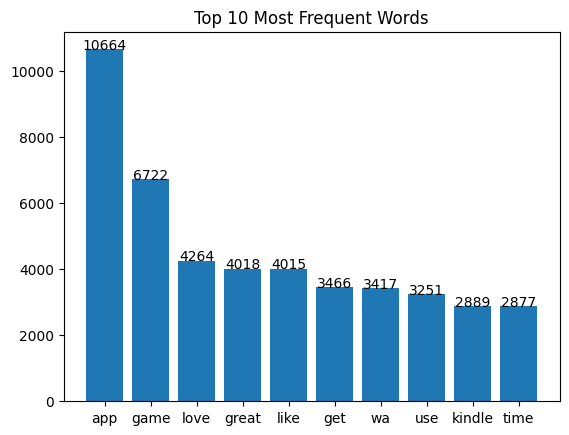

[('app', 10664),
 ('game', 6722),
 ('love', 4264),
 ('great', 4018),
 ('like', 4015),
 ('get', 3466),
 ('wa', 3417),
 ('use', 3251),
 ('kindle', 2889),
 ('time', 2877)]

In [23]:
bag_of_words_analysis(df_temp['Review'])

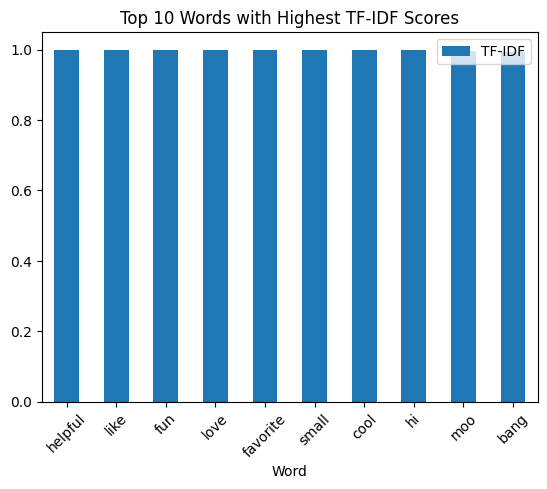

array(['helpful', 'like', 'fun', 'love', 'favorite', 'small', 'cool',
       'hi', 'moo', 'bang'], dtype=object)

In [24]:
tf_idf_analysis(df_temp['Review'])

In [25]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import pairwise_distances
import numpy as np



# TF-IDF method
# Vectorize the reviews using TF-IDF, note min_df could be 0 in the previous version but now it must be larger than 0
# min_df: used for removing terms that appear too infrequently.
# ignore terms that appear in less than 5% of the document
tfidf_review_vectorizer = TfidfVectorizer(min_df=0.05)
tfidf_review_features = tfidf_review_vectorizer.fit_transform(df_temp['Review'])
# print(tfidf_review_features)

# Function to find similar reviews based on TF-IDF
def tfidf_based_model(row_index, num_similar_items):
    # Calculate Euclidean distances from the given review
    couple_dist = pairwise_distances(tfidf_review_features, tfidf_review_features[row_index])
    # Get indices of reviews with the smallest distances
    indices = np.argsort(couple_dist.ravel())[0:num_similar_items]
    print(indices)

    # Create a DataFrame for the similar reviews
    df_new = pd.DataFrame({
        'Review': df_temp['Review'][indices].values,
        'Euclidean similarity': couple_dist[indices].ravel()
    })

    # Display queried review details
    print("="*30, "Queried Review Details", "="*30)
    print('Review:', df_temp['Review'][indices[0]])

    # Display recommended similar reviews
    print("\n", "="*25, "Recommended Reviews:", "="*25)
    return df_new.iloc[1:,]  # Exclude the queried review from the recommendations


tfidf_based_model(30, 11)

[   30 12077 19488  6142  3911 18127 17835 14344  9636  3878  3192]
============================== Queried Review Details ==============================
Review: really like game easy play close board game get hooked

 ========================= Recommended Reviews: =========================


,Review,Euclidean similarity
1,really liked concept using mirror prism reflec...,0.554790
2,amazing game play totally addicting play story...,0.565091
3,grandkids play cant get anywhere game require ...,0.575762
4,game funniest game ever heard really get broth...,0.587819
5,easy play understand character cute game color...,0.603348
6,fantastic game challenging different game play...,0.604801
7,really enjoyed playing game easy learn play se...,0.605046
8,simple memory game picture different yet simil...,0.608624
9,game similar old atari pong excellent graphic ...,0.624839
10,really fun game bored get game u play long tim...,0.627972


In [26]:
# %pip install gensim
# %pip install scipy==1.10.1
from gensim.models import KeyedVectors
import gensim.downloader as api
import numpy as np
from sklearn.metrics import pairwise_distances

# Word2vec
# Load the Word2Vec model

word2vec_model = api.load('word2vec-google-news-300')
# df_temp = df.copy()
# Ensure the model is KeyedVectors for consistency
assert isinstance(word2vec_model, KeyedVectors)
vocabulary = set(word2vec_model.index_to_key)

# Function to create averaged Word2Vec vectors for reviews
def average_word_vectors(review, model, vocabulary, num_features):
    words = review.split()
    feature_vector = np.mean([model[word] for word in words if word in vocabulary] or [np.zeros(num_features)], axis=0)
    return feature_vector

# Apply function to each headline
w2v_reviews = np.array([average_word_vectors(review, word2vec_model, vocabulary, 300) for review in df_temp['Review']])

# Function to find similar reviews based on average Word2Vec vectors
def avg_w2v_based_model(row_index, num_similar_items):
    distances = pairwise_distances(w2v_reviews, w2v_reviews[row_index].reshape(1, -1))
    indices = np.argsort(distances.ravel())[0:num_similar_items]

    # Create DataFrame for displaying results
    similar_reviews = pd.DataFrame({
        'Review': df_temp['Review'][indices].values,
        'Euclidean similarity': distances[indices].ravel()
    })

    # Display details of the queried review
    print("="*30, "Queried Review Details", "="*30)
    print('review:', df_temp['Review'][indices[0]])

    # Display recommended reviews
    print("\n", "="*25, "Recommended Reviews:", "="*25)
    return similar_reviews.iloc[1:,]


avg_w2v_based_model(30, 11)

/Users/youweicheng/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


============================== Queried Review Details ==============================
review: really like game easy play close board game get hooked

 ========================= Recommended Reviews: =========================


,Review,Euclidean similarity
1,really fun game bored get game u play long tim...,0.569727
2,game similar old atari pong excellent graphic ...,0.635790
3,like stop playing time pick right leave good g...,0.651026
4,game breakout offer many twist change make ori...,0.654627
5,play game lot great fun play computer game cha...,0.656154
6,play game every day would recommend everyone l...,0.656380
7,game great age sad know older people hooked ga...,0.658190
8,game fun play really get hooked find wanting p...,0.659070
9,game really fun like different style play dont...,0.662026
10,really enjoy playing game make use brain like ...,0.666768


In [27]:
# use SentimentIntensityAnalyzer to generate sentiment scores

from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA
nltk.download('vader_lexicon')


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/youweicheng/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [28]:
sia = SIA() 
df_temp['sentiment_score'] = [sia.polarity_scores(x)['compound'] for x in df['Review']]

In [29]:
df_temp

,Text,Review,sentiment_score
0,Zomg!!!!! I love this game!!!!! its sort of co...,zomg love game sort confuzling part look cheat...,-0.2732
1,Zolmo seems not to give a tinkers cu$$ about s...,zolmo seems give tinker cu supporting amazon u...,0.1779
2,ZipList is very handy and I really use it a lo...,ziplist handy really use lot phone pull recipe...,0.8074
3,Zero player game. Watch your hero complete que...,zero player game watch hero complete quest hel...,0.8750
4,Zedge carries many different and fun ring/mess...,zedge carry many different fun ringmessage ton...,0.9062
...,...,...,...
19978,5-10-13 I finally loaded this app on a GPS pho...,finally loaded app gps phone opinion product g...,0.0000
19979,4-22-13 -- This app has many options and I exp...,app ha many option expected hard navigate surp...,0.6897
19980,"6/11/2013 OK the backup didn't work, I had jus...",ok backup didnt work backed morning ok tried r...,0.8225
19981,"50,000,000 Frenchmen can't be wrong, nor a who...",frenchman cant wrong whole bunch amazon review...,-0.3865


Text(0.5, 1.0, 'Sentiment Score Distribution')

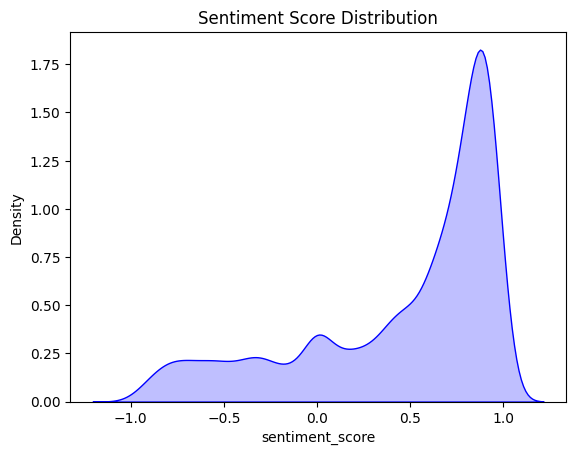

In [30]:
# plot the sentiment score distribution

sns.kdeplot(df_temp['sentiment_score'],fill=True,color="b")
plt.title('Sentiment Score Distribution')

In [31]:
# lexicon ratings which have been normalized between -1(most extreme negative) and +1 (most extreme positive).
# positive sentiment : (compound score >= 0.05) 
# neutral sentiment : (compound score > -0.05) and (compound score < 0.05) 
# negative sentiment : (compound score <= -0.05)

def label_sentiment(x):
  if x <= -0.05:
    return 'negative'
  elif x >= 0.05:
    return 'positive'
  else:
    return 'neutral'
  
df_temp['sentiment'] = df_temp['sentiment_score'].apply(label_sentiment)

In [32]:
df_temp

,Text,Review,sentiment_score,sentiment
0,Zomg!!!!! I love this game!!!!! its sort of co...,zomg love game sort confuzling part look cheat...,-0.2732,negative
1,Zolmo seems not to give a tinkers cu$$ about s...,zolmo seems give tinker cu supporting amazon u...,0.1779,positive
2,ZipList is very handy and I really use it a lo...,ziplist handy really use lot phone pull recipe...,0.8074,positive
3,Zero player game. Watch your hero complete que...,zero player game watch hero complete quest hel...,0.8750,positive
4,Zedge carries many different and fun ring/mess...,zedge carry many different fun ringmessage ton...,0.9062,positive
...,...,...,...,...
19978,5-10-13 I finally loaded this app on a GPS pho...,finally loaded app gps phone opinion product g...,0.0000,neutral
19979,4-22-13 -- This app has many options and I exp...,app ha many option expected hard navigate surp...,0.6897,positive
19980,"6/11/2013 OK the backup didn't work, I had jus...",ok backup didnt work backed morning ok tried r...,0.8225,positive
19981,"50,000,000 Frenchmen can't be wrong, nor a who...",frenchman cant wrong whole bunch amazon review...,-0.3865,negative


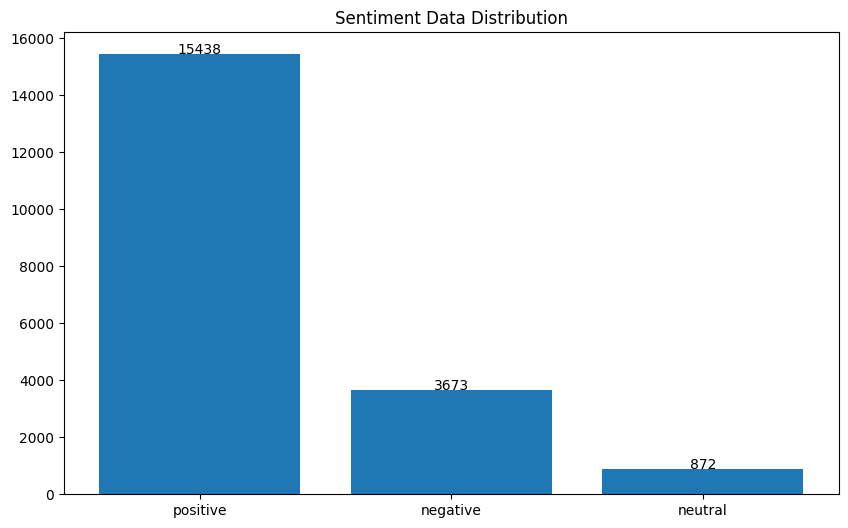

In [33]:
# plot the sentiment data distribution

val_count = df_temp.sentiment.value_counts()

plt.figure(figsize=(10, 6))
plt.bar(val_count.index, val_count.values)
plt.title('Sentiment Data Distribution')

for i, (a, b) in enumerate(zip(val_count.index, val_count.values)):
    plt.text(a, b , "%.0f" % val_count.values[i], ha='center', fontsize=10)


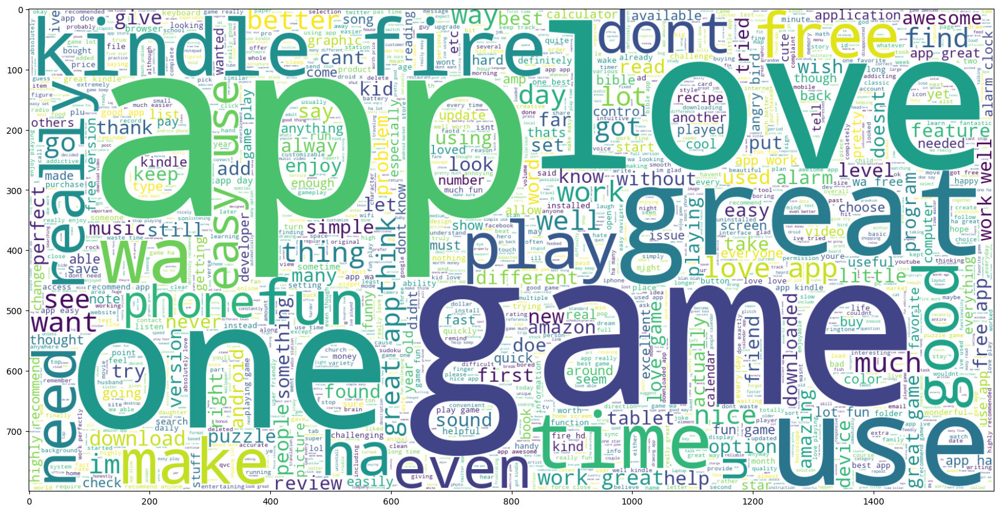

In [34]:
# plot the wordcloud of positive, negative and neutral reviews
from wordcloud import WordCloud

plt.figure(figsize = (20,20))
wc = WordCloud(background_color = 'white',max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df_temp[df_temp.sentiment == 'positive'].Review))
plt.imshow(wc , interpolation = 'bilinear')

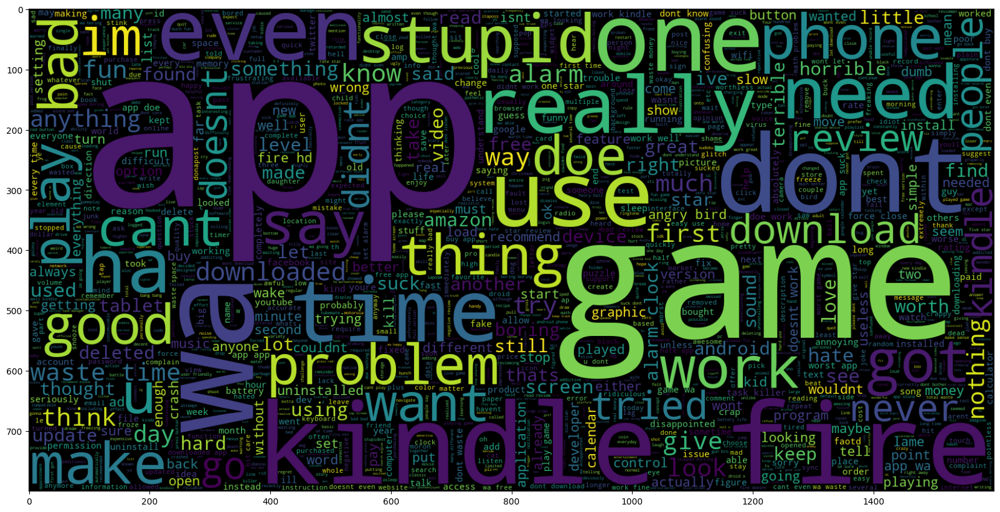

In [35]:
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df_temp[df_temp.sentiment == 'negative'].Review))
plt.imshow(wc , interpolation = 'bilinear')

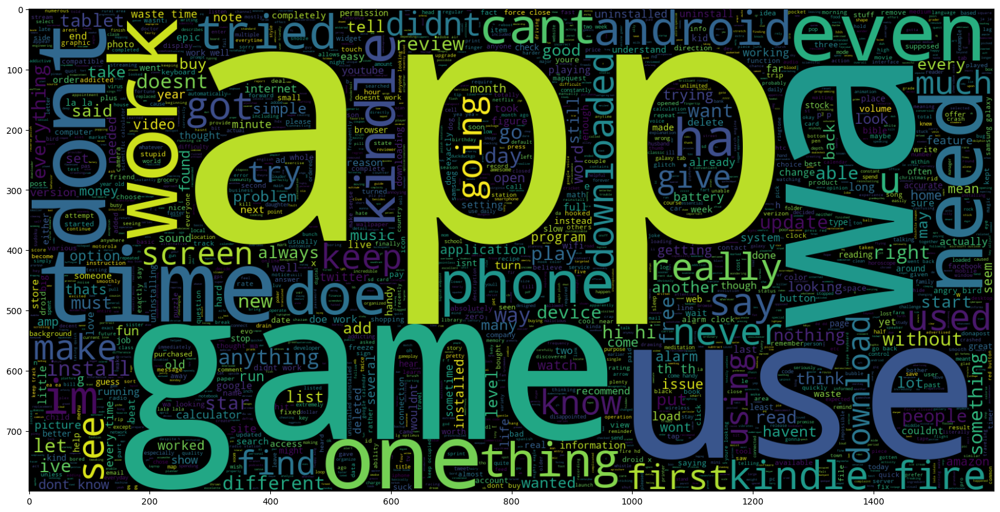

In [36]:
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df_temp[df_temp.sentiment == 'neutral'].Review))
plt.imshow(wc , interpolation = 'bilinear')

In [37]:
# removing the new stop words
stop_words = stopwords.words('english')
new_stopwords = ["wa", "even", "u", "got", "day", 'ha', 'doe']
stop_words.extend(new_stopwords)
def cleaning_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in stop_words])
df_temp['Review'] = df_temp['Review'].apply(lambda text: cleaning_stopwords(text))
df_temp['Review'].head()

0    zomg love game sort confuzling part look cheat...
1    zolmo seems give tinker cu supporting amazon u...
2    ziplist handy really use lot phone pull recipe...
3    zero player game watch hero complete quest hel...
4    zedge carry many different fun ringmessage ton...
Name: Review, dtype: object

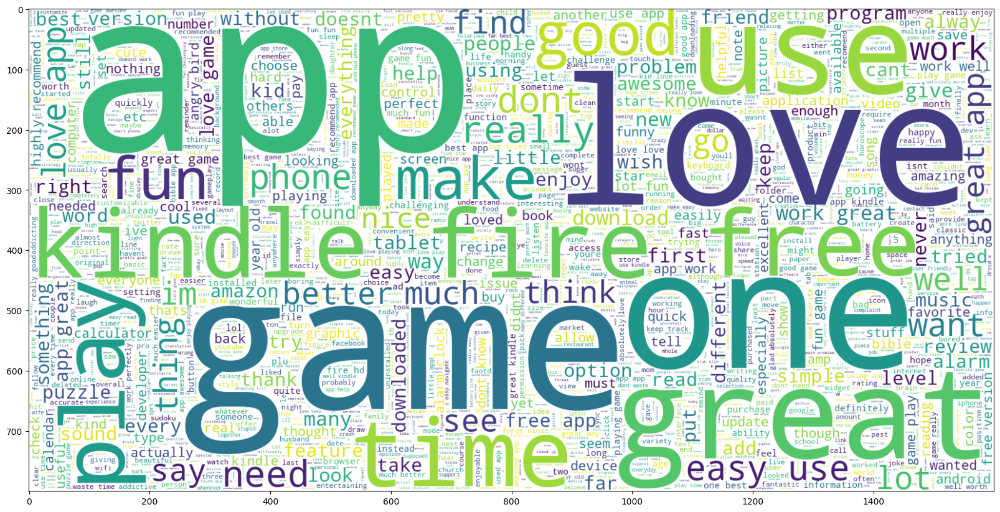

In [38]:
plt.figure(figsize = (20,20))
wc = WordCloud(background_color = 'white',max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df_temp[df_temp.sentiment == 'positive'].Review))
plt.imshow(wc , interpolation = 'bilinear')

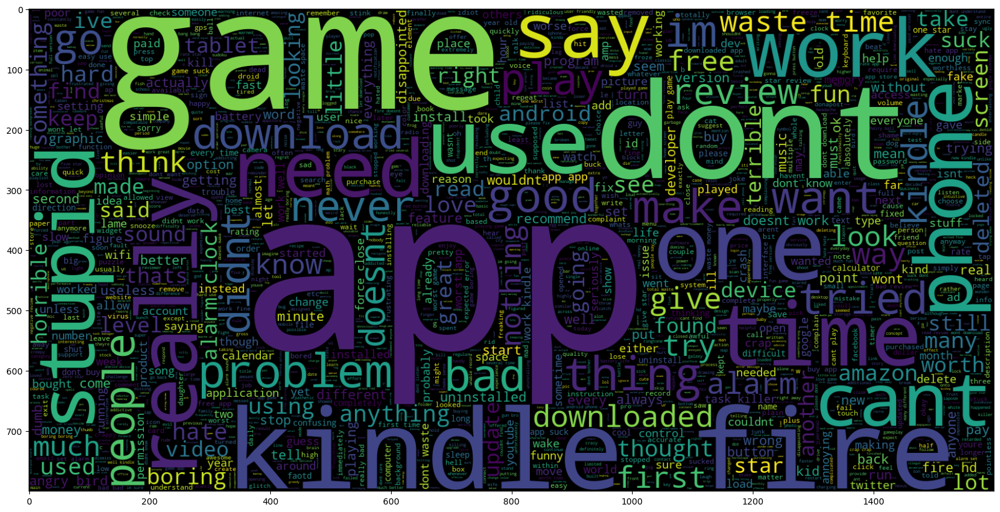

In [39]:
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df_temp[df_temp.sentiment == 'negative'].Review))
plt.imshow(wc , interpolation = 'bilinear')

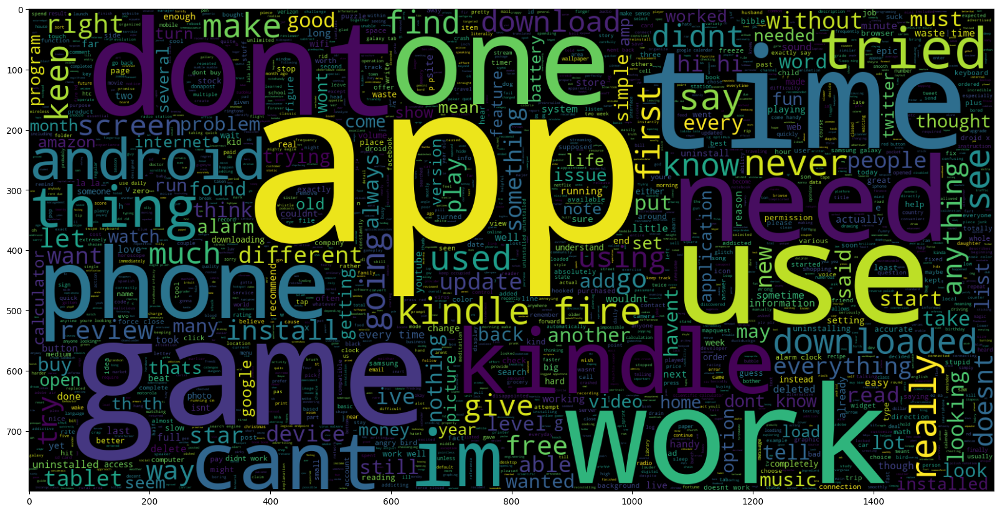

In [40]:
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df_temp[df_temp.sentiment == 'neutral'].Review))
plt.imshow(wc , interpolation = 'bilinear')

In [41]:
from sklearn.model_selection import train_test_split
# Separating the 80% data for training data and 20% for testing data
trainsize = 0.80
X = df_temp['Review']
y = df_temp['sentiment']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=1-trainsize,
                                         random_state=123) # Splits Dataset into Training and Testing set

In [42]:
# TfidfVectorizer.fit_transform is used to create vocabulary from the training dataset
# TfidfVectorizer.transform is used to map that vocabulary to test dataset so that the number of features
# in test data remain same as train data.
from sklearn.feature_extraction.text import CountVectorizer
vec = CountVectorizer(ngram_range=(2,2), max_features=500000)
X_train = vec.fit_transform(X_train)
X_test = vec.transform(X_test)

Training Accuracy : 0.988
Test Accuracy : 0.801
Precision_score:  0.747
Recall_score:  0.801
F1_score:  0.754
[[3019   76    4]
 [ 531  184    1]
 [ 156   26    0]]


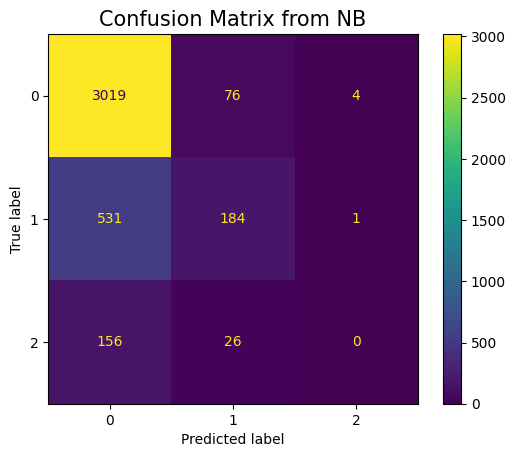

In [43]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, precision_score, f1_score, recall_score

model_NB = MultinomialNB()
model_NB.fit(X_train, y_train)

# average is required for multiclass/multilabel targets. If None, the scores for each class are returned. Otherwise, this determines the type of averaging performed on the data:
# 'binary':
# Only report results for the class specified by pos_label. This is applicable only if targets (y_{true,pred}) are binary.
# 'micro':
# Calculate metrics globally by counting the total true positives, false negatives and false positives.
# 'macro':
# Calculate metrics for each label, and find their unweighted mean. This does not take label imbalance into account.
# 'weighted':
# Calculate metrics for each label, and find their average weighted by support (the number of true instances for each label). This alters ‘macro’ to account for label imbalance; it can result in an F-score that is not between precision and recall.
# 'samples':
# Calculate metrics for each instance, and find their average (only meaningful for multilabel classification where this differs from accuracy_score).

y_pred = model_NB.predict(X_test)
# calculate accuracy, precison, recall and F1 scores
print("Training Accuracy :", round(model_NB.score(X_train, y_train),3))
print("Test Accuracy :", round(model_NB.score(X_test, y_test),3))
print('Precision_score: ',round(precision_score(y_test, y_pred, average='weighted'),3))
print('Recall_score: ',round(recall_score(y_test, y_pred, average='weighted'),3))
print('F1_score: ',round(f1_score(y_test, y_pred, average='weighted'),3))
# confusion matrix
# 0: positvie, 1: negative, 2: neutral
cm = confusion_matrix(y_test, y_pred, labels=["positive", "negative", "neutral"])
print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Confusion Matrix from NB', fontsize=15)
plt.show()

Training Accuracy : 0.999
Test Accuracy : 0.801
Precision_score:  0.747
Recall_score:  0.801
F1_score:  0.75
[[3029   69    1]
 [ 545  171    0]
 [ 165   17    0]]


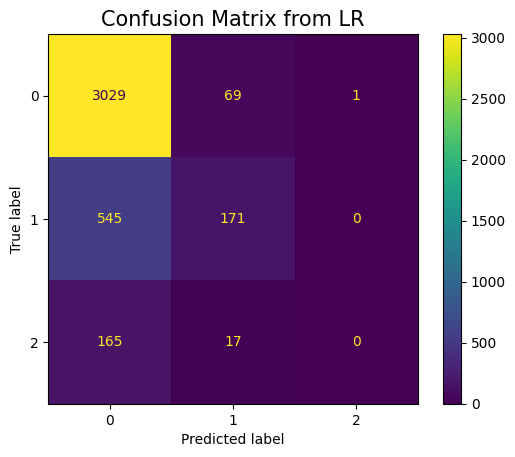

In [44]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(max_iter=10000)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
# calculate accuracy, precison, recall and F1 scores
print("Training Accuracy :", round(model.score(X_train, y_train),3))
print("Test Accuracy :", round(model.score(X_test, y_test),3))
print('Precision_score: ',round(precision_score(y_test, y_pred, average='weighted'),3))
print('Recall_score: ',round(recall_score(y_test, y_pred, average='weighted'),3))
print('F1_score: ',round(f1_score(y_test, y_pred, average='weighted'),3))
# confusion matrix
# 0: positvie, 1: negative, 2: neutral
cm = confusion_matrix(y_test, y_pred, labels=["positive", "negative", "neutral"])
print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Confusion Matrix from LR', fontsize=15)
plt.show()

In [45]:
#Gensim
import gensim
import gensim.corpora as corpora
#spacy
# %pip install spacy
import spacy
#vis
# %pip install pyLDAvis
import pyLDAvis
import pyLDAvis.gensim_models

In [46]:
# The LDA topic model algorithm requires a document word matrix and a dictionary as the main inputs.
# A document-term matrix is a mathematical matrix that describes the frequency of terms that occur in a collection of documents. 
# In a document-term matrix, rows correspond to documents in the collection and columns correspond to terms.
# A Dictionary is collection of all unique tokens present in documents.
# For generating the document-term matrix and dictionary, first we will convert our sentences into tokens using the fucntion mentioned below.

def generate_tokens(review):
    words=[]
    for word in review.split(' '):
    # using the if condition because we introduced extra spaces during text cleaning
         
        if word!='':
           words.append(word)
    return words

df_temp['Review']=df_temp.Review.apply(generate_tokens)

In [47]:
df_temp['Review'][0]

['zomg',
 'love',
 'game',
 'sort',
 'confuzling',
 'part',
 'look',
 'cheat',
 'wen',
 'get',
 'stuckeded',
 'really',
 'get',
 'mean']

In [48]:
def create_dictionary(words):
    return corpora.Dictionary(words)
id2word=create_dictionary(df_temp['Review'])
print(id2word)

Dictionary<21025 unique tokens: ['cheat', 'confuzling', 'game', 'get', 'look']...>


In [49]:
def create_document_matrix(tokens,id2word):
    corpus = []
    for text in tokens:
        corpus.append(id2word.doc2bow(text))
    return corpus
#passing the dataframe column having tokens and dictionary
corpus=create_document_matrix(df_temp['Review'],id2word)
print(df_temp['Review'][0])
print(corpus[0])

['zomg', 'love', 'game', 'sort', 'confuzling', 'part', 'look', 'cheat', 'wen', 'get', 'stuckeded', 'really', 'get', 'mean']
[(0, 1), (1, 1), (2, 1), (3, 2), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1)]


In [50]:
print(df_temp['Review'][1])
print(corpus[1])

['zolmo', 'seems', 'give', 'tinker', 'cu', 'supporting', 'amazon', 'update', 'using', 'galaxy', 'nexus', 'cause', 'repeated', 'unsuccessful', 'download', 'app', 'uninstalled', 'email', 'developer', 'nothing', 'pay', 'get', 'update']
[(3, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 1), (31, 2), (32, 1), (33, 1)]


In [51]:
id2word[0]

'cheat'

In [52]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                            id2word=id2word,
                                            num_topics=10,
                                            random_state=100,
                                             )

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word, mds="mmds", R=30)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
6      0.067631  0.088292       1        1  18.900057
1      0.025561  0.232753       2        1  16.253249
0     -0.195374 -0.151756       3        1  15.323736
9     -0.143500  0.165118       4        1  13.461307
7     -0.037694 -0.222628       5        1   8.194525
4     -0.050873  0.104729       6        1   8.098157
5      0.011669 -0.074654       7        1   7.453192
2     -0.221512  0.013351       8        1   6.275286
8      0.227938 -0.207513       9        1   3.297869
3      0.316155  0.052308      10        1   2.742622, topic_info=      Term          Freq         Total Category  logprob  loglift
2     game   6925.000000   6925.000000  Default  30.0000  30.0000
73     fun   2599.000000   2599.000000  Default  29.0000  29.0000
210   play   2307.000000   2307.000000  Default  28.0000  28.0000
54    dont   2635.000000   2635.000000  Default  27.0000  27.0000
14     app  10279.000000  10279.000000  Default  26.0000  26.0000
..     ...           ...           ...      ...      ...      ...
347  crazy     40.776334     85.691088  Topic10  -5.4061   2.8536
4     look     60.909910    673.995747  Topic10  -5.0048   1.1924
101  great     83.266400   4125.066808  Topic10  -4.6922  -0.3065
14     app     71.990792  10279.818181  Topic10  -4.8377  -1.3651
468   find     51.430238    989.590557  Topic10  -5.1740   0.6392

[797 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
439       1  0.134333     able
439       2  0.194783     able
439       3  0.028546     able
439       4  0.236762     able
439       5  0.045337     able
...     ...       ...      ...
232       7  0.008978  youtube
232       9  0.601516  youtube
3637      3  0.983697   zombie
3323      1  0.028578     zoom
3323      8  0.971654     zoom

[2395 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[7, 2, 1, 10, 8, 5, 6, 3, 9, 4])